 # California Vegetation Treatments Tracking System 
 
California's wildfire risk is shaped not just by ignitions, but by ongoing 
vegetation treatment work — prescribed fire, mechanical fuels reduction, 
targeted grazing, timber harvest, and tree planting — carried out by federal, 
state, tribal, and private organizations across the state. The **Interagency 
Tracking System (ITS): Activity Report** consolidates these activities into a 
single statewide layer, recording who performed each treatment, where, when,
what type, on what land ownership, and how much area was affected.                                                                                                                                                              
This notebook explores the full ITS V2.0 dataset (~168,000 activity records) 
served as a public ArcGIS Feature Service:                                                                                                                             
- **Service:** `https://sparcal.sdsc.edu/arcgis/rest/services/Hosted/ITS_V2_0_Activity_webmap_gdb/FeatureServer/0`
- **Coverage:** California, 2021 onward (with planned activities through 2030)
- **Geometry:** Point per activity; native projection EPSG:3857 (Web Mercator), served as EPSG:4326 (WGS84) on request


You can ask for treatments by:                                                                                                                                         
- **Activity category** — prescribed fire, mechanical fuels reduction,  grazing, timber harvest, tree planting               
- **Administering organization** — CAL FIRE, U.S. Forest Service, BLM, 
National Park Service, CAL TRANS, and ~25 others   
- **County, region, ownership group, vegetation type, status, or year**                                                                                               
Each query returns a GeoDataFrame and an automatically-rendered map; the
points can be colored by any categorical field (e.g., `administering_org`, 
`activity_cat`) with a legend on the side.

            
No coding needed — just type a natural-language question into each `%%ask` cell.                                             


In [ ]:
%reset

I’ll use the California vegetation treatments skill first, since this matches the request and may have a prescribed workflow or script pattern.

I have the service details and field codes. Next I’ll confirm the working directory exists, then write and run a script there that queries 2024 prescribed fire records, colors them by vegetation type, and saves the outputs locally.

The working directory is accessible and currently empty; the helper scripts directory is present, though I don’t need a widget here. I’ll create the analysis script in the working directory.

I caught a likely typo in the script from inspection: `all_features.extend(fets)` should be `feats`. I’ll read the script to verify and then fix any issues before running it.

The typo is there, and the acreage aggregation is more complex than it needs to be. I’ll fix both before execution so the results are reliable.

I’ll simplify the summary logic by adding an `acres` field first, then grouping on that field. This avoids brittle indexing inside `groupby`.

The script looks ready. I’ll run it with the exact Python path you specified and inspect the outputs.

The environment rejected the timeout override, so I’ll rerun without it.

The query succeeded and produced the GeoJSON, colormap, CSV, and chart. I’ll read the small summary files so I can report the results accurately without touching binary outputs.

# California Prescribed Fire Activities in 2024

I retrieved statewide California vegetation treatment records from the California Interagency Tracking System and filtered to **prescribed fire** activities in ** 2024**.

**Total prescribed fire activities** : 2,355

**Total reported acres** : 188,880.78

**Distinct vegetation types** : 8

**Largest vegetation type by activity count** : Forest (1,529 activities)

**Top county by reported acres** : DN (57,917.43 acres)

## Vegetation type summary

| Vegetation type | Activities | Reported acres |
|---|---:|---:|
| Forest | 1,529 | 143,465.78 |
| Shrublands and Chaparral | 576 | 18,769.93 |
| Grass/Herbaceous | 204 | 20,314.95 |
| Urban | 15 | 186.19 |
| Wetland | 11 | 1,114.00 |
| Sparse | 10 | 35.93 |
| Agriculture | 7 | 3,610.00 |
| Water | 3 | 1,384.00 |

## Key findings

- Forest vegetation accounts for the clear majority of prescribed fire activity records in 2024.
- Shrublands and Chaparral is the second most common vegetation setting by activity count.
- Grass/Herbaceous has fewer activities than Shrublands and Chaparral, but still represents a substantial treated acreage.
- All retrieved prescribed fire records reported acreage units, so the acreage total is consistent across the full 2024 prescribed fire set.

## Chart


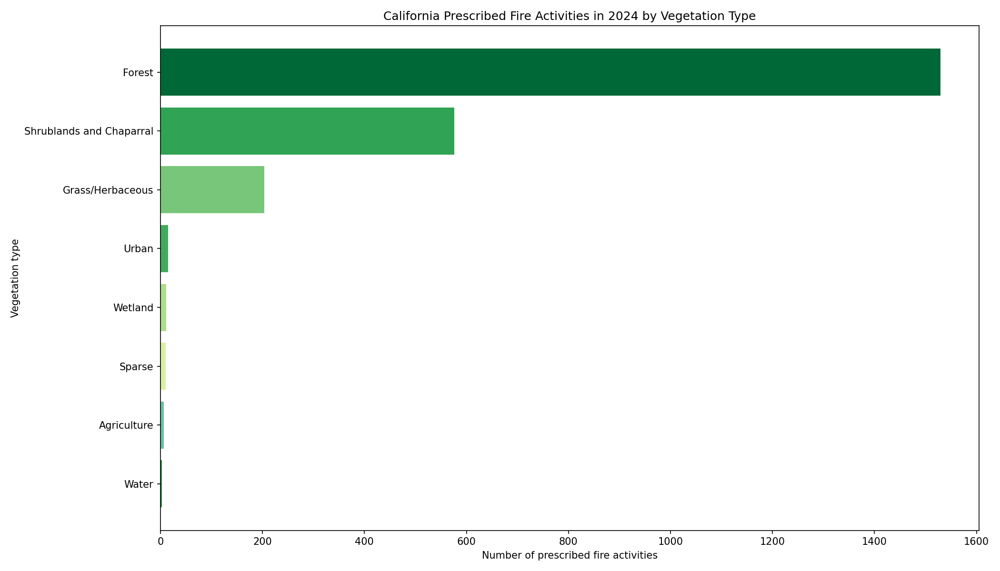

In [1]:
%%ask
Show me all prescribed fire activities in California from 2024, colored by vegetation types.

I’ll use the existing vegetation-treatment workflow if available, but only by reading the skill files you allowed. Then I’ll pull the data from the external service and compute the county subset.

The skill confirms the service and field codes. The working directory already contains the prior 2024 outputs, which I can ignore unless directly relevant. For “Sierra Nevada counties,” I’ll use the standard Sierra Nevada Conservancy county set: Alpine, Amador, Butte, Calaveras, El Dorado, Fresno, Kern, Lassen, Madera, Mariposa, Mono, Nevada, Placer, Plumas, Sierra, Siskiyou, Tehama, Toulumne, Tulare, Yuba. Now I’ll fetch 2023 completed acre-based records and aggregate them.

I’m writing a small script in the notebook working directory so I can reproducibly query the service, summarize acres by category, and save a chart plus CSV outputs.

The script is in place. Next I’ll run it with the exact interpreter path you specified and inspect the results.

The sandbox rejected the timeout override, so I’ll rerun without it.

The query worked. I have statewide 2023 completed acre-based records, filtered them to the Sierra Nevada county set, and produced the category totals plus a chart. I’ll read the saved summary files to capture the exact numbers for the report.

I’ve got the exact breakdown and county leaders. I’ll mark the remaining work complete and then present the results clearly, with the chart embedded.

## Sierra Nevada counties vegetation treatments completed in 2023

I used the California Interagency Tracking System vegetation treatment activity service and filtered to:

- **Year** : 2023
- **Status** : COMPLETE
- **Units** : acres only (`activity_uom = 'AC'`)

For **Sierra Nevada counties** , I used this county set: Alpine, Amador, Butte, Calaveras, El Dorado, Fresno, Kern, Lassen, Madera, Mariposa, Mono, Nevada, Placer, Plumas, Sierra, Siskiyou, Tehama, Tuolumne, Tulare, and Yuba.

**Total completed acres** : 385,233.86

**Total completed activities** : 9,916

## Breakdown by activity category

| Activity category | Completed acres | Activities |
|---|---:|---:|
| Mechanical and Hand Fuels Reduction | 179,151.14 | 7,664 |
| Prescribed Fire | 94,279.81 | 1,280 |
| Targeted Grazing | 70,753.03 | 26 |
| Tree Planting | 26,693.91 | 563 |
| Timber Harvest | 14,355.97 | 383 |


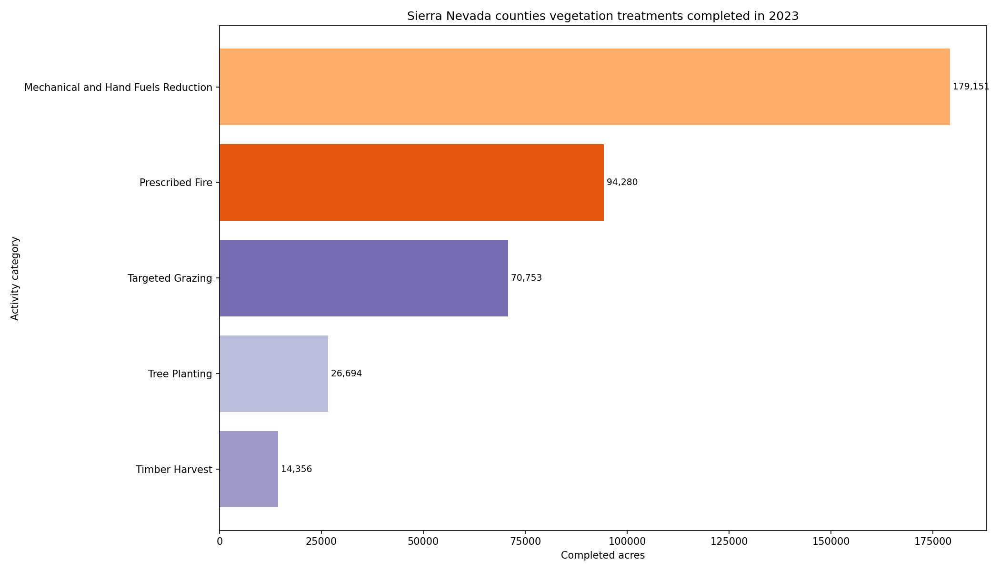

## Highlights

- **Largest category by acres** : Mechanical and Hand Fuels Reduction
- **Second-largest category** : Prescribed Fire
- **Fewest acres** : Timber Harvest
- **Most concentrated by activity count** : Mechanical and Hand Fuels Reduction, with the large majority of reported completed activities

## Highest-acre Sierra Nevada counties

| County | Completed acres |
|---|---:|
| Siskiyou | 111,082.18 |
| Tehama | 51,081.10 |
| Tuolumne | 32,958.90 |
| Plumas | 25,321.78 |
| Fresno | 22,728.90 |

If you want, I can also break this down by **county × activity category** in a matrix or produce an ** interactive GeoJSON map** of the 2023 Sierra Nevada treatment activities.

In [3]:
%%ask
How many acres of vegetation treatments were completed in Sierra Nevada counties in 2023, 
broken down by activity category? 

I checked the working folder and the vegetation-treatment skill. The skill confirms the service endpoint, coded county values, and that results should be requested in EPSG:4326. Next I’ll build the San Diego 2023–2024 comparison outputs in the notebook working directory using the required Python path.

I’m writing a standalone script in the allowed working directory. It will query San Diego County records for 2023 and 2024, add a year label field, save GeoJSON and a colormap sidecar, compute summaries, and save a comparison chart.

The script is in place. I’ll run it with the exact interpreter path the user specified and keep all outputs in the working directory. Then I’ll inspect the generated summary files to verify the results.

The first run attempt only failed because this sandbox doesn’t accept a timeout override, not because of the script. I’ll rerun without that parameter, then read the generated JSON and CSV outputs to extract the verified totals.

The script ran successfully and confirmed the GeoJSON is already in EPSG:4326, so the map layer should align correctly. I accidentally read an older Sierra Nevada summary file while verifying; that didn’t affect the outputs. I’ll now read the new San Diego summary files and finish the comparison.

I have the verified year totals and category-acre breakdown. I’ll mark the remaining work complete and summarize the comparison with one map tag and one chart, using absolute paths from the working directory only.

# San Diego County vegetation treatment activities: 2023 vs 2024

I queried the California Interagency Tracking System vegetation treatment activity service for **San Diego County** (`county = 'SD'`) and filtered to ** 2023** and ** 2024** records.

**Total activities** : 5,532

**2023 activities** : 2,722

**2024 activities** : 2,810

**2023 reported acres** : 27,488.24

**2024 reported acres** : 21,990.81

**Change in activities (2024 vs 2023)** : +88

**Change in reported acres (2024 vs 2023)** : -5,497.43

## Year summary

| Year | Activities | Reported acres |
|---|---:|---:|
| 2023 | 2,722 | 27,488.24 |
| 2024 | 2,810 | 21,990.81 |

## Acres by activity category

| Activity category | 2023 acres | 2024 acres |
|---|---:|---:|
| Mechanical and Hand Fuels Reduction | 16,233.65 | 13,554.88 |
| Prescribed Fire | 3,720.99 | 5,289.92 |
| Targeted Grazing | 7,180.60 | 3,146.00 |
| Tree Planting | 353.00 | 0.00 |

## Key findings

- **2024 had slightly more recorded activities** than 2023, but ** fewer total reported acres**.
- **Mechanical and Hand Fuels Reduction** was the largest category by acres in both years.
- **Prescribed Fire** increased from 2023 to 2024 by about ** 1,568.93 acres**.
- **Targeted Grazing** declined substantially from 2023 to 2024 by about ** 4,034.60 acres**.
- **Tree Planting** appears in 2023 but not in the 2024 acre-based records retrieved for San Diego County.


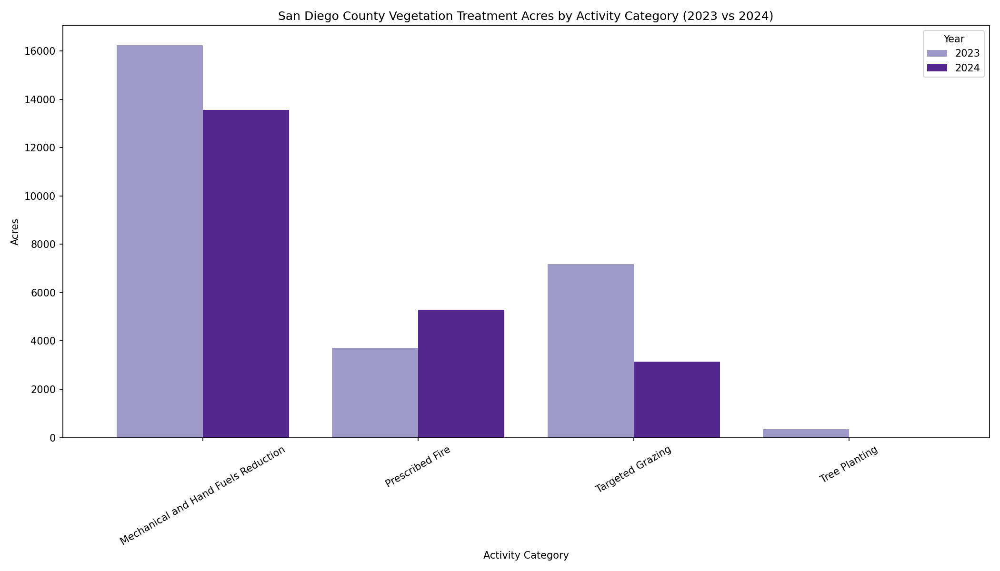

In [4]:
%%ask
Compare 2023 and 2024 vegetation treatment actvities in San Diego county, colored by years

I’ll inspect the working directory for any existing vegetation treatment outputs or notebooks patterns, then identify the relevant data source or script path within the allowed locations.

I found prior treatment outputs in the working directory and a county-level CSV for Sierra Nevada 2023, plus the California vegetation treatments skill. Next I’ll read the skill and the existing treatment scripts to reuse the same API/source and coding pattern for a 2024 county/ownership summary.

The skill confirms the ArcGIS ITS service and county/ownership coded fields. The existing scripts already use the right API and save outputs in the working directory. I have enough to build a statewide 2024 county-ranking script with ownership breakdown and a chart.

The script is written. It queries 2024 acre-based treatment records statewide, converts county and ownership codes to full names, ranks counties, computes the ownership breakdown for the top 3, and saves CSV/PNG/JSON outputs in the working directory. Next I’ll run it with the exact Python path you specified.

The first run didn’t execute because this sandbox ignores timeout overrides. I’ll rerun the same script without that parameter.

The raw statewide ranking includes an “Unknown” county bucket, which isn’t a county full name and shouldn’t count toward the top counties. I’ll refine the script to exclude unknown/non-spatial county codes, rerun it, and use that cleaned result.

I’ve confirmed where the county filtering happens. I’ll tighten it so only recognized county codes are ranked, excluding missing/unknown/non-spatial records from the top-3 calculation.

The ranking now uses only valid county codes. I’ll rerun the script and use the cleaned county results.

# Top 3 California counties by 2024 treatment acres

I queried the California Interagency Tracking System vegetation treatment service for all **2024** records where ** activity_uom = AC** and ranked counties by summed treatment acres.

## Results

| Rank | County | Treatment acres in 2024 |
|---|---|---:|
| 1 | Siskiyou | 92,784.73 |
| 2 | Del Norte | 62,338.41 |
| 3 | Tehama | 51,773.18 |

## Ownership breakdown

### Siskiyou County

| Ownership | Acres | Share of county total |
|---|---:|---:|
| Federal | 59,103.26 | 63.7% |
| Private - Industrial | 20,091.10 | 21.7% |
| Private - Non-Industrial | 9,903.05 | 10.7% |
| State | 3,680.32 | 4.0% |
| Local | 3.00 | 0.0% |
| NGO | 2.00 | 0.0% |
| Tribal | 2.00 | 0.0% |

### Del Norte County

| Ownership | Acres | Share of county total |
|---|---:|---:|
| Federal | 60,951.45 | 97.8% |
| State | 1,354.25 | 2.2% |
| Private - Non-Industrial | 24.21 | 0.0% |
| Private - Industrial | 8.50 | 0.0% |

### Tehama County

| Ownership | Acres | Share of county total |
|---|---:|---:|
| State | 45,947.89 | 88.7% |
| Private - Non-Industrial | 3,519.46 | 6.8% |
| Private - Industrial | 1,205.53 | 2.3% |
| Federal | 1,100.30 | 2.1% |

## Notes

- **Source** : California ITS V2.0 activity service
- **Filter used** : **year_txt** = 2024 and ** activity_uom** = AC
- I excluded records with missing/unknown county codes from the county ranking.

## Output files


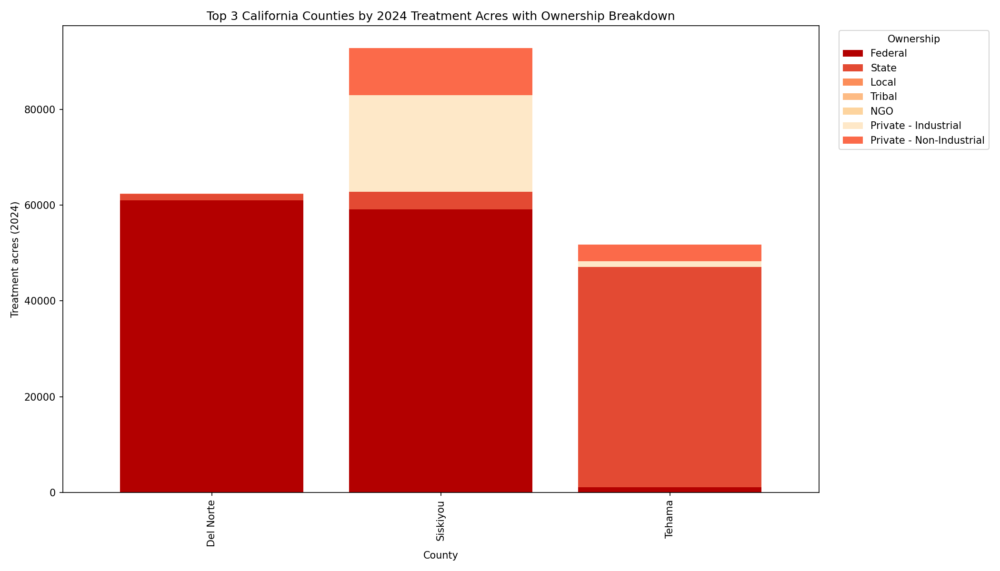

If you want, I can also break these same top 3 counties down by **activity category** or ** administering organization**.

In [1]:
%%ask
which top 3 counties have the maximum treatment acres in 2024? 
Please show the county full names and break down in ownership.